__The flowers underneath our feet__
A hammerdirt botany project

In [22]:
#import statements
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import json
import base64, io, IPython
from PIL import Image as PILImage

In [2]:
#load the data files
here = os.getcwd()

#loads gps-location name correspondance file
afilename = here+"/data/2020/map-keys-2020.csv"
places = pd.read_csv(afilename)

#loads species data set
afilename = here+"/data/2020/species2020_full.csv"
samples = pd.read_csv(afilename)

<h4> Abstract </h4>
This report concludes a 2020 hammerdirt pilot project in identifying and surveying plant species along the urban Suze river and its Madretschkanal variant from June - September 2020. The objective was to use relatively new plant recognition technology combined with the Flora Helvetica guidebook to identify plants and construct an initial dataset on the flowering plants along the urban Suze river.


<h4> Contents </h4>
<ol>
 <li>Objectives</li><li>Background</li><li>Location</li><li>Timeline</li><li>Methodology</li><li>Analysis</li><li>Lessons Learned and Reccomendations</li><li>Bibliography and useful links</li>
</ol>
 

<h4>Objectives</h4>
<ul>
<li>familiarize myself with the local flora, the subject and tools of plant identification</li><li>identify the key botanical and biogeographical datasets available</li><li>build the competencies to present a robust interpretation of my data</li><li>use this experience to develop a plant monitoring scheme for 2021</li>
</ul>

<h4> Background </h4>
<p>Ecological systems in Europe and across the world are under intense stress from various human pressures. Extinction rates are high and on the rise, especially among species dependent on ecological niches that have experienced significant decline, often on the order of 90% loss or greater, since the mid-20th century, such as wetland habitats. It is not just the extinction of species, but the rarefaction of formerly common species alongside a general decline in the mass of mammals, birds and especially insects. This is perhaps best encapsulated by the well-known study that identified a 75% decline between 1989 and 2017 years in flying insect mass captured in a nature reserve in Southern Germany. Plants face similar challenges, including loss of habitat, ravages of invasive species, and rapidly changing climate and weather patterns. As plant communities homogeneize, this leads to a banalization of the insect and animal life that depend on these plant communities for food and shelter.</p>

<p>As the aforementioned trends play out with the uncertainties of climate change looming in the background, the long term health of already fragile ecosystems is at serious risk. While national actors work to set standards and engage in international negotiations on emmission frameworks and related important agreements, local public and private actors have significant room to maneaovre. One way to mitigate the pressure a bit is a judicious use of public space, such as road verges,m railroad berms and parks, that balances their potential as habitats with the needs and requirements of the city's inhabitants. Alongside this, encouraging private sector and civil society initatives that are coming up with innovative horticultural techniques to transform the lived environment. Indeed, studies have shown that these (sub)urban green spaces can provide plants, insects and birds with suitable conditions to pursue their lifecycles, and even become a refuge amidst the ongoing intensification of agriculture and loss of habitat.</p> 

<p></p>



<h4>Survey Locations</h4>

<p>The bulk of the survey sites are located along the suze river and its Madretschkanal branch. They lie primarily between the exit of the Suze river from the Taubenloch gorges and the end of the river into Lake Biel / Thiel river. Along this stretch of the river, as with many urban settings, there are many varied habitats, from deep shade to full pavement to meadows set aside specifically for ecological purposes. These varied habitats offered an opportunity to identify a number of different plants. The sites are managed by the municipality to a greater or less degree and all areas surveyed were open access to the public and chosen to be reasonably accessible for an average person.</p>

<p>In total, surveys were carried out in four geographic regions of Switzerland (Bernese Oberland, Central Plateau, North Jura, Western Plateau), with the majority being on the Central Plateau, near the border with North Jura. In terms of the Welten-Sutter geographic regions, the survey locations largely lie along the border between area 151 (Biel) and area 154 (Grenchen), and close to where area 151 and 154 meet area 300 (Aarberg) and 301 (Büren). They largely lie comfortably within the 585/220 5 kilometer by 5 kilometer set of observations used by Infoflora/Infospecies to organize their citizen observations. In addition, some surveys were conducted near Lac de Neuchatel and Lac de Thoune, in the Jura, and on the other side of Lac de Bienne. All of this information is summarized in the following table.</p>

In [9]:
#insert sample pictures of survey locations (alleestrasse, thunersee)
#insert overall map of survey locations
#insert close-up of Suze + Madretschkanal with Welten Sutter / 5X5 / biogeographic region
#survey locations table

In [33]:
samples = pd.read_csv("output/mostrecent/hd_samples_2020.csv")
samples["locdate"] = list(zip(samples.place, samples.date))
newsamples = pd.read_csv("output/aggregated_list.csv")
with open("output/flora_list.json", "r") as afile:
    data = json.load(afile)

<AxesSubplot:>

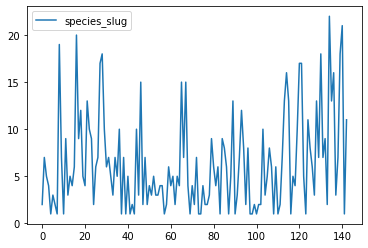

In [45]:
#locations work
numsamps = samples.date.nunique()
numspecies = samples.species_slug.nunique()
numlocs = samples.place.nunique()
numlocdate = samples.locdate.nunique()

vals = [numsamps, numspecies, numlocs]
descriptors = ["survey days", "number of species", "locations"]

atable = [vals, descriptors]

dailytotals = samples.groupby(["locdate","date"], as_index = False).species_slug.nunique()
dailytotals[["date","species_slug"]].plot()

In [40]:
mytable = samples.agg({"date":"nunique", "place":"nunique", "species_slug":"nunique", "locdate":"nunique"})
mytable["a value"] = 1
mytable

date             65
place           111
species_slug    232
locdate         143
a value           1
dtype: int64

In [41]:
newsamples


,species_slug,BL,WL,under_sampled,red_list,gbif,lists
0,abies-alba,0,0,0,1,1,['red_list' 'gbif']
1,abies-nordmanniana,0,0,0,0,1,['gbif']
2,abutilon-theophrasti,1,0,0,0,1,['BL' 'gbif']
3,acacia-dealbata,0,1,0,0,1,['WL' 'gbif']
4,acalypha-australis,0,0,0,0,1,['gbif']
...,...,...,...,...,...,...,...
3844,xeranthemum-inapertum,0,0,0,1,1,['red_list' 'gbif']
3845,yucca-filamentosa,0,0,0,0,1,['gbif']
3846,zannichellia-palustris,0,0,0,1,1,['red_list' 'gbif']
3847,zea-mays,0,0,0,0,1,['gbif']


In [ ]:
#make table function

def make_a_summary_table(ax, data, cols_to_use, a_color='dodgerblue', font_size=12, s_et_bottom_row=True):
  """ Makes a table of values with alternate row colors.
  Args:
    ax: object: matplotlib table object
    data: array: the 2d array used to generate the table object
    cols_to_use: array: the list of column names
    a_color: str: matplotlib named color, face and edgecolor of table cells
    font_size: int: the font size for the table cells
    s_et_bottom_row: bool: whether or not to draw bottom line on the last row
  Returns:
    The table object formatted.
  """

  ax.auto_set_font_size(False)
  the_cells = ax.get_celld()

  line_color = colors.to_rgba(a_color)
  banded_color = (*line_color[:-1], 0.1)



  # the different areas of formatting
  top_row = [(0, i) for i, x in enumerate(cols_to_use)]
  bottom_row = [(len(data), i) for i, x in enumerate(cols_to_use)]
  top_columns = top_row[1:]
  data_rows = [x for x in list(the_cells.keys()) if x not in top_row]
  odd_rows = [x for x in data_rows if x[0] % 2 > 0]
  first_column = [x for x in data_rows if x[1] == 0]

  # make the first cell a littel smaller than the others
  ax[0, 0].set_height(1 / (len(data)))
  ax[0, 0].set_text_props(**{'va': 'top'})

  for a_cell in top_row:
    ax[a_cell].visible_edges = 'B'
    ax[a_cell].set_text_props(**{'fontsize': font_size})
    ax[a_cell].set_edgecolor('white')
    ax[a_cell].PAD = .1

  for a_cell in top_columns:
    ax[a_cell].set_height((1.25 / (len(data))))
    ax[a_cell].set_text_props(**{'va': 'bottom'})
    ax[a_cell].set_edgecolor(line_color)
    ax[a_cell].visible_edges = 'T'

  for a_cell in odd_rows:
    ax[a_cell].set_facecolor(banded_color)

  for a_cell in data_rows:
    ax[a_cell].set_height(.75 / (len(data)))
    ax[a_cell].visible_edges = 'BTLR'
    ax[a_cell].set_text_props(**{'fontsize': font_size})
    ax[a_cell].set_edgecolor('white')

  for a_cell in first_column:
    ax[a_cell]._text.set_horizontalalignment('right')
    ax[a_cell].PAD = .02

  if s_et_bottom_row == True:
    for a_cell in bottom_row:
      ax[a_cell].visible_edges = 'B'
      ax[a_cell].set_edgecolor(line_color)

  return ax


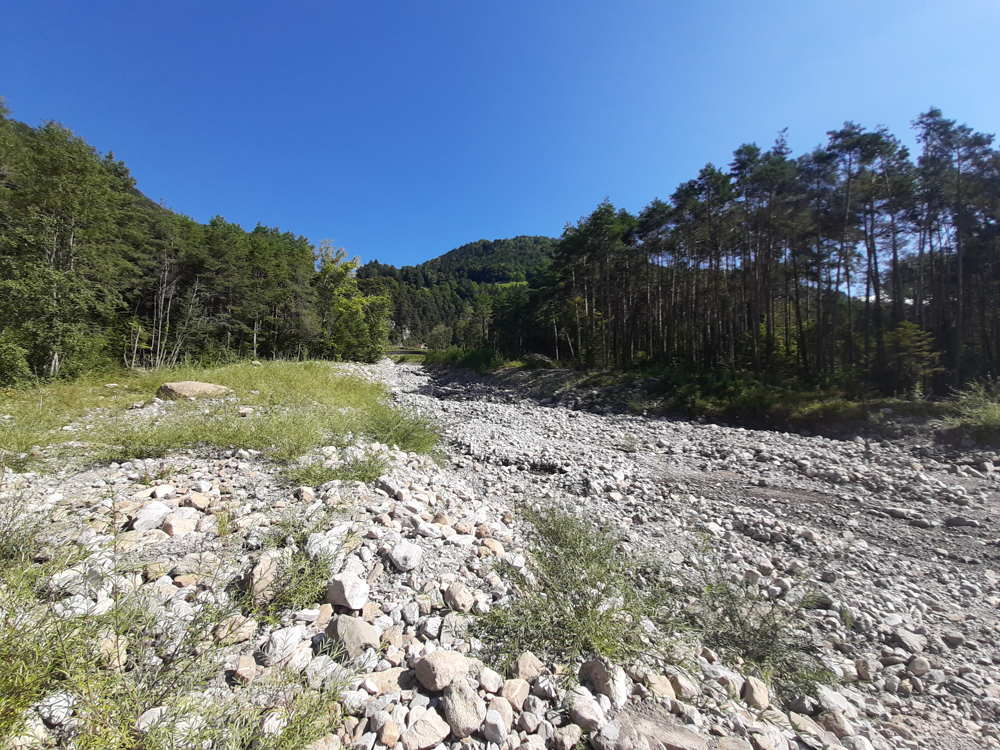

In [11]:
image = "pictures/sites/sundlaunen.jpg"
output = io.BytesIO()
an_image = PILImage.open(image)
an_image.save(output, format = "PNG")
encoded_string = base64.b64encode(output.getvalue()).decode()

an_image.thumbnail((960,720))

html = '<img src = "data:image/png;base64,{}"/>'.format(encoded_string)
IPython.display.HTML(html)

<h4>Survey period</h4>
<p>The survey period stretched from June - September 2020, with the majority of plant observations accomplished in August and September 2020.</p>

In [1]:
#insert chart of observation frequency by date

<h4>Methodology</h4>

<p>The surveys attempt to answer the question “what are the different types of herbaceous plants flowering in this location?" By design, non flowering plants, grasses and trees were excluded. The trees were excluded as they are included in the cadastre des arbres of Biel, which means recording them would only be repeating a task already largely completed. The nonflowering plants and grasses were excluded due to the difficulty in identifying them for an amateur. In some cases trees were indeed included, especially Sorbus and Sambusca genera and similar due to their conspicuous flowers and berries.At first a few different transect methods were tried, but this led to missing many of the plants on site. It was quickly decided to simple identify all of the herbeaceous plants in a given location that wwould be reasonably easy to identify again either through the satellite view on google maps or the aerial photos on SwissTopo. </p>
    
<p>Plants were identified both in situ and ex situ by combining an automatic plant identification tool and the 4th edition of the Flora Helvetica guidebook. In the interest of preserving the flora examined, few samples were taken. The samples that were retrieved were to examen the structures under a microscope for educational purposes or to take detailed pictures in a more conducive environment. Some samples were dried and preserved. samples were taken to examine under a microscope or just in a more conducive (less windy, rainy, sunny) environment.  A combination of a smart phone camera (Samsung A50, Samsung A7) and a digital camera (Sony Cybershot) were used for the pictures.</p>

<p>A survey is uniquely identified by a place name and a date and is composed of a collection of individual species observations, each of which records the following information: place, date and scientific name. The place name corresponds to a set of gps points. The survey locations were chosen largely so that the geographic extent of the survey location would be more or less clear from the satellite imagery. This survey includes also photographs of the sites and many of the flowers identified stored separately Notes and a drawing accompany many of the surveys, as well as one or more photographs of the survey area at the time the survey was conducted.</p>

<p>Due to starting the surveys in June, there were a large number of different herbaceous plants in flower and the surveyor had no prior experience, so the choice was made to exclude some common types of flowering plants from the surveys in order to cover a decent amount of territory and not initially sort through difficult families / genera. These were mainly plants that grew close to the ground and produced small or difficult to distinguish flowers, such as grasses and the crepis, cardamine, hieracium, taraxacum, plantago and trifolium generas as well as members of the asteracea family. By the end of the survey period many of the excluded herbaceous plants were added to the surveys as the surveyor gained the experience and confidence to record different species in these genera.</p>

<p>Two smartphone applications (Flora Incognita and PlantNet) and one web application (PlantNet) provided the automatic plant recognition. For the first half of the survey period, in June and July, a series of picture were taken with the digital camera and submitted to the PlantNet web application, which generated a number of possible species. Those with a relatively high probability were investigated in the guidebook and pictures and/or samples were then taken for further confirmation. Accompanied by a GPS point and notes, the survey was later reconstructed. This was an innefficient and inneffective process that led to the loss of a number of observations. This  Once the species was confirmed with a reasonable degree of certainty it was entered in the database. The bias was to record the most common of the species observed given that the surveys were conducted in urban settings where presumably one would encounter the most common species at an even higher rate than furhter out in rural areas.</p>

<p>From July 31st through September 30th, the smartphone application FloraIncognita was used to record and store the species observations. The approach was similar: first the plant would be identified following the flora incognita entry requirements, then the most likely species was searched in Flora Helvetica to determine if the match was correct or not. If confirmed, the result was accepted and stored in the application. If the match was unsatisfactory, the other suggested species were examined. If no species was a satisfactory match, it was saved as unknown and a sample and/or detailed pictures were then taken and the species eventually identified to a satisfactory degree in a controlled setting. Notes were taken alongside.</p>

In [2]:
# insert screenshot of flora helvetica, plantnet app.

<h4>Results</h4>



In [ ]:
# insert summary statistics table: 
# number of different species identified, min species identified per site, maximum identified per site, avg identified per site

<h4>Lessons Learned and Reccomendations</h4>

The goal of this project to survey the plants that grow along the river that flows through my neighborhood and begin developping my own skills in the field of biological mapping and data analysis. Throughout this time, one major reflection is that the data is not enough. In some manner, such information needs to be combined from the beginning with an immediate improvement of the situation. To take the example of conducting beach litter surveys: even if no one uses the data, the beach is meticulously cleaned. This is concrete improvement of the world and is important for  projects to remain materially grounded in the production of value. 

While these lessons learned have largely been about plant surveying and related data, it is clear that the pursuit of seed collection, invasive species removal, production of some horticultural good, or other concrete benefit and value needs to come out of these surveys and this project next year In the meantime, the lessons learned from this initial report on surveying the flowering plants in Biel are the following:
<ul>
    <li>Data resources available</li><li>Plant identification tools</li><li>Diversity of citizen science initiatives</li><li>knowledge of the herbaceous flora around Biel/Bienne</li>
</ul>

<h5>Data resources available</h5>

<p>In writing this report and conducting background reading a number of useful data sources for mapping the flora across Switzerland. First is the data available through InfoFlora, namely the Welten-Sutter areas and the 5x5 kilometer squares of observations. These low resolution, open source data sets primarily allow a quick comparison to see if a species has already been identified in the region and overall allow to see how many of the plants in the region have been identified. Higher resolution data is available upon request. Comparing observations from this surveyor to observations confirmed by Flora Helvetica would be a useful check on the integrity of the surveyor's data set and permit an evaluation of the evolution of the area since the other Flora Helvetica observations were conducted.</p>

<p>Biel, like many cities in Switzerland, also maintains a registry of the trees on the city's public spaces. This data is available to browse with identification to the species, horticultural variety or genus level, as well as information on when the tree was planted and the survey conducted. It is not clear at the time of this report what other data may be available upon request. Clearly, this dataset would be a perfect complement to the more complete study on herbaceous plant species in 2021, giving quite a good picture of the flora of the city.</p>


Recomendations:

<ul>
    <li>Request the full data set of the registry of the trees of Biel.</li><li>Request a higher resolution detail of the observations from Info Flora for the region around Biel</li><li>Request the Welten Sutter and 5kmx5km polygon layers for Switzerland</li>
</ul>


<h5>Plant identification and observation recording tools</h5>

The two plant identification tools that were used were PlantNet (identify.plantnet.org) and Flora Incognita. A number of others were researched and briefly tested but these two apps came from the most reputable sources and were the clear frontrunners in terms of accuracy and functionality for use in Switzerland. In the end, they can be used interchangeably, as they gave consistently similar results. Plantnet has an edge in terms of functionality thanks to the availablility of a web application. In the end, if in doubt the identification was confirmed through the 5th edition of Flora Helvetica regardless of the tool used. In addition to functioning as identification tools, these apps also serve as a list of observations. The Flora Incognita app was chosen to fulfill this dual purpose. Unfortunately, the GPS coordinates were not verified and later found to be off on the order of 250 meters for every single observation. The locations were largely reconstructed, but some observations were unfortunately lost.

The following table gives a brief comparison of the two tools. 
Both of them gave consistently similar identification results. 
Generally, PlantNet gave a wider net of possible identifications, while Flora Incognita's input algorithm gave a more precies identification
PlantNet's GPS system is signicantly superior to Flora Incognita
Both link to more information directly about the plant, PlantNet gives a lot more links, Flora incogntia curates the content
Can add custom observations
Easy export observations to .csv

The main inconvenience of using an identification app to also store all observations was the needless recording of pictures and skipping through recognition steps for common plants that were easily identified, thus it is recommended to only use the applications as identification support tools. Since it is best to only have one master list of species identified, the most effective ways are through either a field notebook or through the flora helvetica application, or a combination of the two. The flora helvetica application is very well built, fast, and offers a wide variety of predefined indicators as well as custom input fields. All in all, this is an effective standalone multipurpose data entry tool that can meet the needs of surveying flowes in an urban environment. A signficant improvement is the release of the Flora Helvetica guidebook application. This means that with a few taps of the finger, a surveyor can go from a plant recognication application, to the flora helvetica guidebook for confirmation, to data entry in the flora helvetica application.

Finally, there are a number of other related ecological indicators whose presence would be of significant value to decision makers concerning the promotion of nature based solutions in (sub)urban environments. One example is the habiapp, which allows surveyors to identify and introduce trees which have unique microhabitats key to the lifecycles of many of Switzerland's rarest insects. These habitats (holes in the trunk of three, dead wood hanging in the tree branches, etc) can be identified, catalogued and tracked to determine whether the specific habitats of different organisms present only at certain stages of the evoluation of these environments are available for colonization or if the region is in effect inhospitable to these species. Of course, the hammerdirt beach litter survey application can be deployed across urban locations.

Recomendations:

<ul>
    <li>Obtain the digital version of the Flora Helvetica guidebook.</li><li>Use the Flora Helvetica application to record observations</li><li>Identify further applications designed for use in surveys of regional flora</li>
</ul>

<h5>Diversity of citizen science initiatives around regional flora</h5>

<p>There are a large number of citizen science initiatives with more or less engagement from the public available. In Switzerland, this flows mainly through InfoFlora which provides varied offers through the useable and intuitive flora helvetica web application. At the same time, Infoflora does not have any active projects adapted to urban flora. In France, Telebotanica, a grouping of French botanists, has a number of ways to participate in specifically identifying plants growing in urban environments. These range from specifically identifying types of lichens to track air quality to identifying the flora around the base of trees planted in urban environments and the methodologies should be examined for potential applicaiton to Biel/Bienne.</p>

<p>About 25 kilometers away from Biel, Bern conducted a participative science program in 2017 where some 70 thousand flora observations from around the city were submitted. This data would make an excellent comparison to the 2020 and especially the forthcoming 2021 data set. It is not clear at the time of writing of this report whether other local governments have put in place similar programs. </p>

Recomendations:

<ul>
    <li>Obtain the digital version of the Flora Helvetica guidebook.</li><li>Use the Flora Helvetica application or a dedicated journal to record observations going forward</li><li>Request the Welten Sutter and 5kmx5km polygon layers for Switzerland</li><li>Request the data from the results of the Berne observations of the flora of the city</li>
</ul

<h5>Knowledge of the herbaceous plants around Biel/Bienne</h5>


In [ ]:
# insert screenshot of flora helvetica, plantnet app.
# insert screenshot of cadastre des arbres with selections

<h5>Bibliography and useful links</h5>

<p> <ul><li>Study of insect communities in Luzern and Zürich https://www.sciencedirect.com/science/article/pii/S0169204611002593?casa_token=uQZ1v0tFvMMAAAAA:mdcKSrLbZHJGvzxGXCxaD3nIMhdbk3-ixso0jie_erf_hSYQqMaYt4qCcc8TZRC_cS8VZGVJWA</li><li>Cadastre des arbres: https://www.nateco.ch/fr/projets/gruenflaechen/126-ville-de-bienne-cadastre-des-arbres</li><li>Info Flora data: https://www.infoflora.ch/fr/donnees.html</li><li></li><ul/></p>

A large number of observations were lost from June and July due to an inneficient collection protocol and a lack of familiarity with the subject matter.

__Comparison of the identification tools__
#INSERT LINKS
A number of plant identification tools were downloaded and tested,  The three that stood out for the purposes of this study were iNaturalist, PlantNet, and Flora Incognita. Of these, the latter are developped under European initiatives and so were chosen to be the primary image recognication tools used in this project. In the experience of this project, PlantNet's identification methodology proved more functional for an amateur to begin identifying newly encountered flowers as it tended to generated more possible species than Flora Incognita. If poor photos were submitted PlantNet more often returned a result which could still be used as a starting point in the guidebook, while Flora Incognita sometimes returned no result or fewer similar possibilities. Overall, this made little difference as most of the very similar species were in the same genera, and grouped in such a way as to be fairly readily comparable in the Flora Helvetica guidebook. 

On the other hand, Flora Incognita proved superior as a provisional data entry tool until hammerdirt builds a prototype application due to its simple and effective data entry and export option. Going forward the reccomendation is to continue using either plant id tool combined with the flora helvetica guidebook when in doubt.


In [5]:
#photos of the flora incognita and plantnet phone applications?
#table of applications downloaded and tested

__Findings__


__Comparison with the 2014 Info Flora Watch List / BLack List of invasives and the Welten-Sutter Area 151__

InfoFlora maintains 

__Neophytes & Invasives__

The following invasive plant species on the _liste noire des plantes neophytes envahissantes_ were identified: 
1) Buddleja davidii
2) Erigeron annuus
3) Solidago canadensis


In [6]:
#number of times each of the above species was identified, and % of total in a table.

This study aligns with the second part of the modern definition of biodiversity:
<ul>
    <li>ecological biodiversity or the diversity of biotopes</li>
    <li>species diversity within these different ecological spaces</li>
    <li>genetic diversity of each species</li>
</ul>



In [7]:
#photo of Erigeron a. buddleja d., solidago c.

Erigeron annuus is a 